In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor
from scipy import stats


In [2]:
data = pd.read_csv('../data/toyota.csv')
data['model'] = data['model'].apply(lambda x: x.strip())
cols = data.columns

## Easy

Возьмём машины марки toyota и обучим DecisionTreeRegressor

In [3]:
unique, count_model = np.unique(data['model'], return_counts=True)
df_count_model = pd.DataFrame({'model': unique, 'count': count_model})
df_count_model

,model,count
0,Auris,712
1,Avensis,115
2,Aygo,1961
3,C-HR,479
4,Camry,11
5,Corolla,267
6,GT86,73
7,Hilux,86
8,IQ,8
9,Land Cruiser,51


In [4]:
df_count_model[df_count_model['count'] < 50]

,model,count
4,Camry,11
8,IQ,8
10,PROACE VERSO,15
13,Supra,12
14,Urban Cruiser,4
16,Verso-S,3


В датасете есть модели машин с очень малым количеством представителей, обучить модель на некоторых из них нельзя, т.к. в выборке слишком мало данных. Поэтому будем игнорировать их

In [5]:
car_models = data.loc[:, ["model"]].drop_duplicates().values

car_only_models = data["model"].value_counts().reset_index(name='count')
car_only_models = car_only_models[car_only_models['count'] > 100]
toyota_models = car_only_models['model'].drop_duplicates().values
data = data.loc[(data.model.isin(car_only_models.model.values))]
data

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize
73,Corolla,2019,22500,Automatic,8006,Other,140,85.6,1.8
74,Corolla,2005,1300,Manual,129000,Petrol,260,36.7,1.8
75,Corolla,2019,20250,Automatic,7445,Hybrid,140,85.6,1.8
76,Corolla,2020,26980,Automatic,5000,Hybrid,135,72.4,2.0
77,Corolla,2019,21995,Automatic,8789,Hybrid,135,85.6,1.8
...,...,...,...,...,...,...,...,...,...
6543,Verso,2016,10990,Manual,19000,Petrol,205,41.5,1.6
6544,Verso,2016,14995,Automatic,22703,Petrol,165,43.5,1.8
6545,Verso,2017,15995,Automatic,13900,Petrol,165,43.5,1.8
6546,Verso,2015,13994,Automatic,19293,Petrol,200,41.5,1.8


In [6]:
x = data.loc[:, data.columns != 'price']
y = data['price']

# toyota_models = np.array(x.model.drop_duplicates().values)

easy_features = ['model', 'mileage', 'tax', 'mpg', 'engineSize']
# x = data.loc[:, (data.columns != 'price')]
# y = data.loc[:, (data.columns == 'price')]
x_easy = x.loc[:, easy_features]
x_easy.head()

,model,mileage,tax,mpg,engineSize
73,Corolla,8006,140,85.6,1.8
74,Corolla,129000,260,36.7,1.8
75,Corolla,7445,140,85.6,1.8
76,Corolla,5000,135,72.4,2.0
77,Corolla,8789,135,85.6,1.8


In [7]:
x_train, x_test, y_train, y_test = train_test_split(x_easy, y, test_size=0.3, shuffle=True)

Подберём гиперпараметры для DecisionTreeRegressor

In [8]:
params = {
    'criterion': ['squared_error', 'absolute_error'],
    'max_depth': [5, 20, 50, 100],
    'min_samples_leaf': [5, 10, 30, 50, 100],
}

search = GridSearchCV(DecisionTreeRegressor(), params)


index_2_save_train = x_train[x_train.model != "Corolla"].index
x_model_train = x_train.drop(index_2_save_train)   
x_model_train = x_model_train.loc[:, x_model_train.columns != 'model']
y_model_train = y_train.drop(index_2_save_train)

search.fit(x_model_train, y_model_train)
dec_tree_param = search.best_params_
search.best_estimator_

DecisionTreeRegressor(max_depth=20, min_samples_leaf=5)

In [9]:
toyota_models_dict = dict()
toyota_models_score_train = dict()
toyota_models_score_test = dict()
for m in toyota_models:
    index_2_drop_train = x_train[x_train.model != m].index
    index_2_drop_test = x_test[x_test.model != m].index
    x_model_train = x_train.drop(index_2_drop_train)   
    x_model_test = x_test.drop(index_2_drop_test)
    x_model_train = x_model_train.loc[:, x_model_train.columns != 'model']
    x_model_test = x_model_test.loc[:, x_model_test.columns != 'model']
    y_model_train = y_train.drop(index_2_drop_train)
    y_model_test = y_test.drop(index_2_drop_test)
    
    dec_tree_param = search.best_params_
    model = DecisionTreeRegressor(**dec_tree_param)
    
    model.fit(x_model_train, y_model_train)
    
    toyota_models_dict[m] = model
    
    y_pred = model.predict(x_model_train)
    toyota_models_score_train[m] = r2_score(y_model_train, y_pred)
    y_pred = model.predict(x_model_test)
    toyota_models_score_test[m] = r2_score(y_model_test, y_pred)
    

In [10]:
print(toyota_models_score_train)

{'Yaris': 0.8912346768669056, 'Aygo': 0.883038885474784, 'Auris': 0.8644026584684064, 'C-HR': 0.8508210260445983, 'RAV4': 0.9672025102948946, 'Corolla': 0.9385406129693729, 'Prius': 0.8510269912281447, 'Avensis': 0.870443145459083, 'Verso': 0.8680354584511897}


In [11]:
print(toyota_models_score_test)

{'Yaris': 0.7600221870267945, 'Aygo': 0.7529252850401216, 'Auris': 0.8091403692402148, 'C-HR': 0.7247361823529787, 'RAV4': 0.8974850347798935, 'Corolla': 0.9124425426784459, 'Prius': 0.6645296876914077, 'Avensis': 0.6342470935321942, 'Verso': 0.6613018734264542}


Видно, что на некоторых моделях, Decision Tree переобучается. Возможно, это происходит из-за того, что гиперпараметры не подходят для конкретной модели

Проинтерпретируем данные, посмотрим на дерево для модели одной из модели машин:

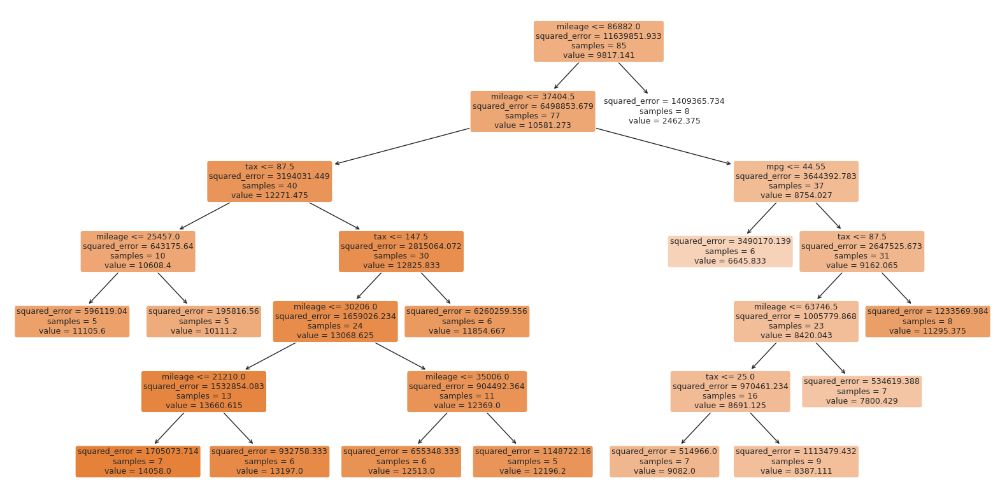

In [12]:
plt.figure(figsize=(20,10))  
plot_tree(toyota_models_dict["Avensis"], feature_names = x_train.iloc[:, 1:].columns, 
             filled=True, fontsize=9, rounded = True)
plt.show()

Посмотрим на feature importances

In [13]:
feature_imp = pd.DataFrame({"Feature": x_easy.iloc[:, 1:].columns})

for m in toyota_models:
    if toyota_models_dict[m] is not None:
        imp = pd.Series(toyota_models_dict[m].feature_importances_, name=f"Importance_<{m}>")
        feature_imp = pd.concat([feature_imp, imp], axis=1)

feature_imp

,Feature,Importance_<Yaris>,Importance_<Aygo>,Importance_<Auris>,Importance_<C-HR>,Importance_<RAV4>,Importance_<Corolla>,Importance_<Prius>,Importance_<Avensis>,Importance_<Verso>
0,mileage,0.360603,0.134303,0.285194,0.595343,0.170019,0.631156,0.872641,0.852820,0.802163
1,tax,0.011471,0.003861,0.025661,0.065895,0.001482,0.000000,0.065356,0.110223,0.009213
2,mpg,0.102427,0.861836,0.111975,0.060955,0.284443,0.368844,0.062003,0.036958,0.003012
3,engineSize,0.525499,0.000000,0.577169,0.277807,0.544056,0.000000,0.000000,0.000000,0.185611


Видно, что в большинстве моделей пробег является самой важной фичей из всех. Также в некоторых моделях являются важными налог и размер двигателя и mpg.

Воспользуемся критерием Стьюдента, чтобы проверить, какой из признаков самый важный

In [14]:
for i in range(len(easy_features[1:])):
    for j in range(len(easy_features[1:])):
        if i != j:
            st, p_value = stats.ttest_ind(list(feature_imp.iloc[i, 1:].values), list(feature_imp.iloc[j, 1:].values), alternative='greater')
            print(f"H1: {easy_features[i+1]} > {easy_features[j+1]} => p_value: {p_value} < 0.05: {p_value < 0.05}")
print("===========================================================================")
for i in range(len(easy_features[1:])):
    for j in range(len(easy_features[1:])):
        if i != j:
            st, p_value = stats.ttest_ind(list(feature_imp.iloc[i, 1:].values), list(feature_imp.iloc[j, 1:].values), alternative='less')
            print(f"H1: {easy_features[i+1]} < {easy_features[j+1]} => p_value: {p_value} < 0.05: {p_value < 0.05}")

H1: mileage > tax => p_value: 6.774050509565794e-05 < 0.05: True
H1: mileage > mpg => p_value: 0.01613406678747668 < 0.05: True
H1: mileage > engineSize => p_value: 0.020348725161445064 < 0.05: True
H1: tax > mileage => p_value: 0.9999322594949043 < 0.05: False
H1: tax > mpg => p_value: 0.9647072177574345 < 0.05: False
H1: tax > engineSize => p_value: 0.9838312036762262 < 0.05: False
H1: mpg > mileage => p_value: 0.9838659332125234 < 0.05: False
H1: mpg > tax => p_value: 0.03529278224256548 < 0.05: True
H1: mpg > engineSize => p_value: 0.5758021865332679 < 0.05: False
H1: engineSize > mileage => p_value: 0.979651274838555 < 0.05: False
H1: engineSize > tax => p_value: 0.016168796323773705 < 0.05: True
H1: engineSize > mpg => p_value: 0.4241978134667321 < 0.05: False
H1: mileage < tax => p_value: 0.9999322594949043 < 0.05: False
H1: mileage < mpg => p_value: 0.9838659332125234 < 0.05: False
H1: mileage < engineSize => p_value: 0.979651274838555 < 0.05: False
H1: tax < mileage => p_value

Видно, что пробег является самой "важной" фичей, а наименее "важной" - налог

Теперь попробуем обучить Random Forest. Подберём гиперпараметры:

In [15]:
params = {
    'n_estimators': [5, 20, 50, 60, 100],
    'criterion': ['squared_error', 'absolute_error'],
    'max_depth': [5, 20, 50, 100],
    'min_samples_leaf': [5, 10, 50],
    'max_samples': [10, 30, 50],
    'min_samples_split': [5, 15, 20, 40]
}

search = GridSearchCV(RandomForestRegressor(), params)


index_2_save_train = x_train[x_train.model != car_only_models[car_only_models['count'] == car_only_models['count'].min()].model.iloc[0]].index
x_model_train = x_train.drop(index_2_save_train)   
x_model_train = x_model_train.loc[:, x_model_train.columns != 'model']
y_model_train = y_train.drop(index_2_save_train)

search.fit(x_model_train, y_model_train)
rand_forest_param = search.best_params_
search.best_estimator_

RandomForestRegressor(max_depth=50, max_samples=50, min_samples_leaf=5,
                      min_samples_split=5, n_estimators=20)

In [16]:
toyota_models_rand_forest_dict = dict()
toyota_models_rand_forest_score_train = dict()
toyota_models_rand_forest_score_test = dict()
for m in toyota_models:    
    index_2_save_train = x_train[x_train.model != m].index
    index_2_save_test = x_test[x_test.model != m].index
    x_model_train = x_train.drop(index_2_save_train)   
    x_model_test = x_test.drop(index_2_save_test)
    x_model_train = x_model_train.loc[:, x_model_train.columns != 'model']
    x_model_test = x_model_test.loc[:, x_model_test.columns != 'model']
    y_model_train = y_train.drop(index_2_save_train)
    y_model_test = y_test.drop(index_2_save_test)

    model = RandomForestRegressor(**rand_forest_param)

    model.fit(x_model_train, y_model_train)
    
    toyota_models_rand_forest_dict[m] = model
    
    y_pred = model.predict(x_model_train)
    toyota_models_rand_forest_score_train[m] = r2_score(y_model_train, y_pred)
    y_pred = model.predict(x_model_test)
    toyota_models_rand_forest_score_test[m] = r2_score(y_model_test, y_pred)
    

In [17]:
print(toyota_models_rand_forest_score_train)

{'Yaris': 0.7390809227594288, 'Aygo': 0.710854835076308, 'Auris': 0.7129532419168915, 'C-HR': 0.7303701885245697, 'RAV4': 0.8932863725794283, 'Corolla': 0.6830123079501349, 'Prius': 0.7125444072401835, 'Avensis': 0.7752604087674514, 'Verso': 0.7834582635669916}


In [18]:
print(toyota_models_rand_forest_score_test)

{'Yaris': 0.6849896012512606, 'Aygo': 0.660764304138228, 'Auris': 0.7348535946414765, 'C-HR': 0.7034446763222523, 'RAV4': 0.8784402671479299, 'Corolla': 0.6450484569559816, 'Prius': 0.6610886205367608, 'Avensis': 0.7642576529774312, 'Verso': 0.7083121286266709}


In [19]:
st, p_value = stats.ttest_ind(np.array([*toyota_models_rand_forest_score_test.values()]), np.array([*toyota_models_score_test.values()]), alternative='less')
print(f"H1: RandForest_score < DecisionTree_score: p_value {p_value}, p_value < 0.05 {p_value < 0.05}")

H1: RandForest_score < DecisionTree_score: p_value 0.16266925314073122, p_value < 0.05 False


Критерий Стьюдента показывает, что Decision Tree даёт результат лучше

In [20]:
feature_imp = pd.DataFrame({"Feature": x_easy.iloc[:, 1:].columns})

for m in toyota_models:
    if toyota_models_rand_forest_dict[m] is not None:
        imp = pd.Series(toyota_models_rand_forest_dict[m].feature_importances_, name=f"Importance_<{m}>")
        feature_imp = pd.concat([feature_imp, imp], axis=1)

feature_imp

,Feature,Importance_<Yaris>,Importance_<Aygo>,Importance_<Auris>,Importance_<C-HR>,Importance_<RAV4>,Importance_<Corolla>,Importance_<Prius>,Importance_<Avensis>,Importance_<Verso>
0,mileage,0.383416,0.536190,0.305443,0.718041,0.384008,0.347223,0.826088,0.780945,0.846671
1,tax,0.015798,0.128418,0.054612,0.105673,0.016261,0.217849,0.129561,0.107306,0.011599
2,mpg,0.055956,0.335392,0.163143,0.040528,0.115373,0.363259,0.044351,0.067133,0.008505
3,engineSize,0.544830,0.000000,0.476803,0.135758,0.484357,0.071669,0.000000,0.044615,0.133225


In [21]:
for i in range(len(easy_features[1:])):
    for j in range(len(easy_features[1:])):
        if i != j:
            st, p_value = stats.ttest_ind(list(feature_imp.iloc[i, 1:].values), list(feature_imp.iloc[j, 1:].values), alternative='greater')
            print(f"H1: {easy_features[i+1]} > {easy_features[j+1]} => p_value: {p_value} < 0.05: {p_value < 0.05}")
print("===========================================================================")
for i in range(len(easy_features[1:])):
    for j in range(len(easy_features[1:])):
        if i != j:
            st, p_value = stats.ttest_ind(list(feature_imp.iloc[i, 1:].values), list(feature_imp.iloc[j, 1:].values), alternative='less')
            print(f"H1: {easy_features[i+1]} < {easy_features[j+1]} => p_value: {p_value} < 0.05: {p_value < 0.05}")

H1: mileage > tax => p_value: 6.463394833921863e-06 < 0.05: True
H1: mileage > mpg => p_value: 5.7272725573398154e-05 < 0.05: True
H1: mileage > engineSize => p_value: 0.0018120723617189162 < 0.05: True
H1: tax > mileage => p_value: 0.9999935366051661 < 0.05: False
H1: tax > mpg => p_value: 0.8130427930111259 < 0.05: False
H1: tax > engineSize => p_value: 0.9313468421814786 < 0.05: False
H1: mpg > mileage => p_value: 0.9999427272744266 < 0.05: False
H1: mpg > tax => p_value: 0.18695720698887403 < 0.05: False
H1: mpg > engineSize => p_value: 0.8075457345334205 < 0.05: False
H1: engineSize > mileage => p_value: 0.9981879276382811 < 0.05: False
H1: engineSize > tax => p_value: 0.06865315781852142 < 0.05: False
H1: engineSize > mpg => p_value: 0.1924542654665795 < 0.05: False
H1: mileage < tax => p_value: 0.9999935366051661 < 0.05: False
H1: mileage < mpg => p_value: 0.9999427272744266 < 0.05: False
H1: mileage < engineSize => p_value: 0.9981879276382811 < 0.05: False
H1: tax < mileage => 

Для Random Forest также самым важным является пробег, и наименее важным - налог

Обучим CatBoost

In [22]:
toyota_models_cb_dict = dict()
toyota_models_cb_score_train = dict()
toyota_models_cb_score_test = dict()
for m in toyota_models:
    
    index_2_save_train = x_train[x_train.model != m].index
    index_2_save_test = x_test[x_test.model != m].index
    x_model_train = x_train.drop(index_2_save_train)   
    x_model_test = x_test.drop(index_2_save_test)
    x_model_train = x_model_train.loc[:, x_model_train.columns != 'model']
    x_model_test = x_model_test.loc[:, x_model_test.columns != 'model']
    y_model_train = y_train.drop(index_2_save_train)
    y_model_test = y_test.drop(index_2_save_test)
    
    model = CatBoostRegressor(eval_metric='R2', depth=int(np.log2(y_model_train.shape[0])), min_data_in_leaf=5)

    model.fit(x_model_train, y_model_train, eval_set=(x_model_test, y_model_test))
    
    toyota_models_cb_dict[m] = model
    
    y_pred = model.predict(x_model_train)
    toyota_models_cb_score_train[m] = r2_score(y_model_train, y_pred)
    y_pred = model.predict(x_model_test)
    toyota_models_cb_score_test[m] = r2_score(y_model_test, y_pred)

Learning rate set to 0.054003
0:	learn: 0.0737841	test: 0.0593702	best: 0.0593702 (0)	total: 56.5ms	remaining: 56.5s
1:	learn: 0.1391193	test: 0.1186219	best: 0.1186219 (1)	total: 60.8ms	remaining: 30.3s
2:	learn: 0.2010688	test: 0.1736672	best: 0.1736672 (2)	total: 72.2ms	remaining: 24s
3:	learn: 0.2514559	test: 0.2190542	best: 0.2190542 (3)	total: 72.7ms	remaining: 18.1s
4:	learn: 0.3016372	test: 0.2670428	best: 0.2670428 (4)	total: 73.8ms	remaining: 14.7s
5:	learn: 0.3463713	test: 0.3083659	best: 0.3083659 (5)	total: 75ms	remaining: 12.4s
6:	learn: 0.3862290	test: 0.3458506	best: 0.3458506 (6)	total: 83.1ms	remaining: 11.8s
7:	learn: 0.4268317	test: 0.3838227	best: 0.3838227 (7)	total: 88.6ms	remaining: 11s
8:	learn: 0.4619049	test: 0.4157415	best: 0.4157415 (8)	total: 93.9ms	remaining: 10.3s
9:	learn: 0.4928562	test: 0.4451635	best: 0.4451635 (9)	total: 95.9ms	remaining: 9.5s
10:	learn: 0.5238337	test: 0.4742366	best: 0.4742366 (10)	total: 102ms	remaining: 9.13s
11:	learn: 0.550365

In [23]:
print(toyota_models_cb_score_train)

{'Yaris': 0.8908202661611704, 'Aygo': 0.8430564214244898, 'Auris': 0.8915062621954802, 'C-HR': 0.8608959804142031, 'RAV4': 0.9855030228815499, 'Corolla': 0.9454590656353546, 'Prius': 0.9791530381166202, 'Avensis': 0.9335234425295384, 'Verso': 0.9265124832481295}


In [24]:
print(toyota_models_cb_score_test)

{'Yaris': 0.8120295188318453, 'Aygo': 0.8070356533751426, 'Auris': 0.844031228309875, 'C-HR': 0.7904393145048596, 'RAV4': 0.9439630227305941, 'Corolla': 0.9207686291946581, 'Prius': 0.8197401181838352, 'Avensis': 0.750455358269541, 'Verso': 0.7854394543663177}


Видно, что CatBoost даёт лучший результат, если сравнивать с предыдущими моделями

In [25]:
feature_imp = pd.DataFrame({"Feature": x_easy.iloc[:, 1:].columns})

for m in toyota_models:
    if toyota_models_rand_forest_dict[m] is not None:
        imp = pd.Series(toyota_models_cb_dict[m].feature_importances_, name=f"Importance_<{m}>")
        feature_imp = pd.concat([feature_imp, imp], axis=1)

feature_imp

,Feature,Importance_<Yaris>,Importance_<Aygo>,Importance_<Auris>,Importance_<C-HR>,Importance_<RAV4>,Importance_<Corolla>,Importance_<Prius>,Importance_<Avensis>,Importance_<Verso>
0,mileage,31.313521,17.368218,28.221028,50.327819,30.113132,33.340287,44.442418,38.981204,45.909245
1,tax,12.663851,14.562592,8.127732,13.290586,8.752693,14.679408,14.754155,29.367507,7.433764
2,mpg,24.958488,67.747453,23.097006,15.970589,27.688905,29.267704,35.794602,15.433008,11.827540
3,engineSize,31.064139,0.321737,40.554233,20.411006,33.445270,22.712601,5.008825,16.218281,34.829452


In [26]:
for i in range(len(easy_features[1:])):
    for j in range(len(easy_features[1:])):
        if i != j:
            st, p_value = stats.ttest_ind(list(feature_imp.iloc[i, 1:].values), list(feature_imp.iloc[j, 1:].values), alternative='greater')
            print(f"H1: {easy_features[i+1]} > {easy_features[j+1]} => p_value: {p_value} < 0.05: {p_value < 0.05}")
print("===========================================================================")
for i in range(len(easy_features[1:])):
    for j in range(len(easy_features[1:])):
        if i != j:
            st, p_value = stats.ttest_ind(list(feature_imp.iloc[i, 1:].values), list(feature_imp.iloc[j, 1:].values), alternative='less')
            print(f"H1: {easy_features[i+1]} < {easy_features[j+1]} => p_value: {p_value} < 0.05: {p_value < 0.05}")

H1: mileage > tax => p_value: 3.250886601348734e-05 < 0.05: True
H1: mileage > mpg => p_value: 0.13218827722697446 < 0.05: False
H1: mileage > engineSize => p_value: 0.01989801971570767 < 0.05: True
H1: tax > mileage => p_value: 0.9999674911339865 < 0.05: False
H1: tax > mpg => p_value: 0.9848589433668679 < 0.05: False
H1: tax > engineSize => p_value: 0.9521864479360901 < 0.05: False
H1: mpg > mileage => p_value: 0.8678117227730255 < 0.05: False
H1: mpg > tax => p_value: 0.01514105663313212 < 0.05: True
H1: mpg > engineSize => p_value: 0.23892689568696296 < 0.05: False
H1: engineSize > mileage => p_value: 0.9801019802842923 < 0.05: False
H1: engineSize > tax => p_value: 0.04781355206390992 < 0.05: True
H1: engineSize > mpg => p_value: 0.761073104313037 < 0.05: False
H1: mileage < tax => p_value: 0.9999674911339865 < 0.05: False
H1: mileage < mpg => p_value: 0.8678117227730255 < 0.05: False
H1: mileage < engineSize => p_value: 0.9801019802842923 < 0.05: False
H1: tax < mileage => p_valu

Аналогичное утверждение про "важность" фич верно и для CatBoost

## Median

In [27]:
from os import listdir
from os.path import isfile, join

In [28]:
files = [fi for fi in listdir('../data') if isfile(join('../data', fi)) and (re.match('unclean', fi) is None)]
files

['bmw.csv',
 'hyundi.csv',
 'cclass.csv',
 'toyota.csv',
 'audi.csv',
 'skoda.csv',
 'vauxhall.csv',
 'vw.csv',
 'merc.csv',
 'ford.csv',
 'focus.csv']

Не будем брать файлы с unclear данными, а также файлы ford.csv и cclass.csv, т.к. они не содержат некоторые фичи

In [29]:
data = pd.DataFrame(columns=['brand', *cols])
brands = []
for f in files:
    df = pd.read_csv(f'../data/{f}')
    brand = f[:-4]
    if brand == "hyundi":
        df = df.rename(columns={"tax(£)": "tax"})
    if f == "cclass.csv" or f == "focus.csv":
        continue
    brands.append(brand)
    df.insert(0, "brand", brand)
    df['model'] = df['model'].apply(lambda x: x.strip())
    data = pd.concat([data, df], axis=0)

/tmp/ipykernel_29180/4281402746.py:13: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  data = pd.concat([data, df], axis=0)


In [30]:
data = pd.get_dummies(data, columns=["transmission", "fuelType"])
data.head()

,brand,model,year,price,mileage,tax,mpg,engineSize,transmission_Automatic,transmission_Manual,transmission_Other,transmission_Semi-Auto,fuelType_Diesel,fuelType_Electric,fuelType_Hybrid,fuelType_Other,fuelType_Petrol
0,bmw,5 Series,2014,11200,67068,125,57.6,2.0,True,False,False,False,True,False,False,False,False
1,bmw,6 Series,2018,27000,14827,145,42.8,2.0,True,False,False,False,False,False,False,False,True
2,bmw,5 Series,2016,16000,62794,160,51.4,3.0,True,False,False,False,True,False,False,False,False
3,bmw,1 Series,2017,12750,26676,145,72.4,1.5,True,False,False,False,True,False,False,False,False
4,bmw,7 Series,2014,14500,39554,160,50.4,3.0,True,False,False,False,True,False,False,False,False


Уберём данные с количеством сэмплов, непревышающее 100

In [31]:
car_models = data.loc[:, ["brand", "model"]].drop_duplicates().values

car_brand_models =  data[['brand', 'model']].value_counts().reset_index(name='count')
car_brand_models = car_brand_models[car_brand_models['count'] > 100]
car_brand_models

,brand,model,count
0,ford,Fiesta,6557
1,vw,Golf,4863
2,ford,Focus,4588
3,merc,C Class,3747
4,vauxhall,Corsa,3441
...,...,...,...
107,bmw,Z4,108
108,bmw,7 Series,106
109,bmw,X6,106
110,vw,Caravelle,101


In [32]:
data = data.loc[(data.brand.isin(car_brand_models.brand.values)) & (data.model.isin(car_brand_models.model.values))]
data

,brand,model,year,price,mileage,tax,mpg,engineSize,transmission_Automatic,transmission_Manual,transmission_Other,transmission_Semi-Auto,fuelType_Diesel,fuelType_Electric,fuelType_Hybrid,fuelType_Other,fuelType_Petrol
0,bmw,5 Series,2014,11200,67068,125,57.6,2.0,True,False,False,False,True,False,False,False,False
1,bmw,6 Series,2018,27000,14827,145,42.8,2.0,True,False,False,False,False,False,False,False,True
2,bmw,5 Series,2016,16000,62794,160,51.4,3.0,True,False,False,False,True,False,False,False,False
3,bmw,1 Series,2017,12750,26676,145,72.4,1.5,True,False,False,False,True,False,False,False,False
4,bmw,7 Series,2014,14500,39554,160,50.4,3.0,True,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17960,ford,Fiesta,2016,7999,31348,125,54.3,1.2,False,True,False,False,False,False,False,False,True
17961,ford,B-MAX,2017,8999,16700,150,47.1,1.4,False,True,False,False,False,False,False,False,True
17962,ford,B-MAX,2014,7499,40700,30,57.7,1.0,False,True,False,False,False,False,False,False,True
17963,ford,Focus,2015,9999,7010,20,67.3,1.6,False,True,False,False,True,False,False,False,False


In [33]:
x = data.loc[:, (data.columns != 'price')]
y = data.loc[:, (data.columns == 'price') | (data.columns == 'brand') | (data.columns == 'model')]
features = x.loc[:, (x.columns != 'model') & (x.columns != 'brand')]
x.shape, y.shape

((96961, 16), (96961, 3))

In [34]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, shuffle=True)

In [35]:
params = {
    'criterion': ['squared_error', 'absolute_error'],
    'max_depth': [5, 20, 50, 100],
    'min_samples_leaf': [5, 10, 50],
    'min_samples_split': [5, 15, 20, 40]
}

search = GridSearchCV(DecisionTreeRegressor(), params)

min_car = car_brand_models[car_brand_models['count'] == car_brand_models['count'].min()].iloc[0]

index_2_save_train = x_train[(x_train.model != min_car.model) & (x_train.brand != min_car.brand)].index
x_model_train = x_train.drop(index_2_save_train)   
x_model_train = x_model_train.loc[:, (x_model_train.columns != 'model') & (x_model_train.columns != 'brand')]
y_model_train = y_train.drop(index_2_save_train)

search.fit(x_model_train, y_model_train.price)
dec_tree_param = search.best_params_
search.best_estimator_

DecisionTreeRegressor(max_depth=100, min_samples_leaf=5, min_samples_split=5)

In [36]:
car_dec_tree_dict = dict()
car_dec_tree_score_train = dict()
car_dec_tree_score_test = dict()

for brand_model in car_brand_models.iterrows():
    
    x_train_brand_model = x_train.loc[(x_train.brand == brand_model[1].brand) & (x_train.model == brand_model[1].model), (x_train.columns != 'brand') & (x_train.columns != 'model')]
    x_test_brand_model = x_test.loc[(x_test.brand == brand_model[1].brand) & (x_test.model == brand_model[1].model), (x_test.columns != 'brand') & (x_test.columns != 'model')]
    y_train_brand_model = y_train.loc[(y_train.brand == brand_model[1].brand) & (y_train.model == brand_model[1].model), (y_train.columns != 'brand') & (y_train.columns != 'model')]
    y_test_brand_model = y_test.loc[(y_test.brand == brand_model[1].brand) & (y_test.model == brand_model[1].model), (y_test.columns != 'brand') & (y_test.columns != 'model')]
    
    p = dec_tree_param
    
    p["max_depth"] = int(np.log2(y_train_brand_model.shape[0]))
    
    model = DecisionTreeRegressor(**p)
    
    model.fit(x_train_brand_model, y_train_brand_model)
    car_dec_tree_dict[f"{brand_model[1].brand}_{brand_model[1].model}"] = model
    y_pred = model.predict(x_train_brand_model)
    car_dec_tree_score_train[f"{brand_model[1].brand}_{brand_model[1].model}"] = r2_score(y_train_brand_model, y_pred)
    y_pred = model.predict(x_test_brand_model)
    car_dec_tree_score_test[f"{brand_model[1].brand}_{brand_model[1].model}"] = r2_score(y_test_brand_model, y_pred)

In [37]:
print(car_dec_tree_score_train)

{'ford_Fiesta': 0.9312479367145803, 'vw_Golf': 0.9547125954897144, 'ford_Focus': 0.9479256538627433, 'merc_C Class': 0.9468676262194621, 'vauxhall_Corsa': 0.9346814312231273, 'vw_Polo': 0.9551911156920824, 'vauxhall_Astra': 0.9359878984423874, 'merc_A Class': 0.9766281745308586, 'bmw_3 Series': 0.9561939679114846, 'ford_Kuga': 0.9045141076872071, 'vauxhall_Mokka X': 0.8109506129767885, 'toyota_Yaris': 0.9134453326517316, 'bmw_1 Series': 0.9535334611957783, 'toyota_Aygo': 0.8735016026045785, 'merc_E Class': 0.9623543236606583, 'audi_A3': 0.9395696201027646, 'vw_Tiguan': 0.9207839663616451, 'skoda_Fabia': 0.9049078595251395, 'skoda_Octavia': 0.9313160066027869, 'audi_Q3': 0.9568725151468154, 'audi_A4': 0.9532387768785673, 'audi_A1': 0.9508323873912466, 'hyundi_Tucson': 0.8860515681575599, 'bmw_2 Series': 0.6443265026323246, 'ford_EcoSport': 0.9453697632962639, 'hyundi_I10': 0.4335896818625885, 'bmw_5 Series': 0.9456200293285698, 'vauxhall_Insignia': 0.9539711809320393, 'bmw_4 Series': 0.

In [38]:
print(car_dec_tree_score_test)

{'ford_Fiesta': 0.8760507167002127, 'vw_Golf': 0.9291160268920533, 'ford_Focus': 0.8695675005863122, 'merc_C Class': 0.8777559330486782, 'vauxhall_Corsa': 0.8639572539071019, 'vw_Polo': 0.9318094291955865, 'vauxhall_Astra': 0.8922072053005758, 'merc_A Class': 0.9620779202661763, 'bmw_3 Series': 0.930791765899887, 'ford_Kuga': 0.7758255380935991, 'vauxhall_Mokka X': 0.6743263102730419, 'toyota_Yaris': 0.8676664447625455, 'bmw_1 Series': 0.9107482971003577, 'toyota_Aygo': 0.8439925456021089, 'merc_E Class': 0.9265336313642839, 'audi_A3': 0.9100103608593502, 'vw_Tiguan': 0.8627317467062873, 'skoda_Fabia': 0.8301911116908184, 'skoda_Octavia': 0.8603154749805707, 'audi_Q3': 0.9208891604807086, 'audi_A4': 0.905437967531608, 'audi_A1': 0.9102438456641702, 'hyundi_Tucson': 0.8209892602115941, 'bmw_2 Series': 0.6844445110781366, 'ford_EcoSport': 0.9066807343903688, 'hyundi_I10': 0.08586699692355382, 'bmw_5 Series': 0.898042632876615, 'vauxhall_Insignia': 0.8529740468423476, 'bmw_4 Series': 0.81

In [39]:
min_score_brand_dt = min(car_dec_tree_score_test, key=car_dec_tree_score_test.get) 
print(f"min score - {min_score_brand_dt}: {car_dec_tree_score_test[min_score_brand_dt]}")

min score - vauxhall_Combo Life: 0.06738471088383102


In [40]:
print(f"mean score: {sum(car_dec_tree_score_test.values()) / len(car_dec_tree_score_test.values())}")

mean score: 0.773512740483162


В среднем результат неплохой, но некоторые модели машин не угадывает вообще

In [41]:
params = {
    'n_estimators': [5, 20, 50, 60, 100],
    'criterion': ['squared_error', 'absolute_error'],
    'max_depth': [5, 20, 50, 100],
    'min_samples_leaf': [5, 10, 50],
    'max_samples': [10, 30, 50],
    'min_samples_split': [5, 15, 20, 40]
}

search = GridSearchCV(RandomForestRegressor(), params)

min_car = car_brand_models[car_brand_models['count'] == car_brand_models['count'].min()].iloc[0]

index_2_save_train = x_train[(x_train.model != min_car.model) & (x_train.brand != min_car.brand)].index
x_model_train = x_train.drop(index_2_save_train)   
x_model_train = x_model_train.loc[:, (x_model_train.columns != 'model') & (x_model_train.columns != 'brand')]
y_model_train = y_train.drop(index_2_save_train)

search.fit(x_model_train, y_model_train.price)
rand_forest_param = search.best_params_
search.best_estimator_

RandomForestRegressor(criterion='absolute_error', max_depth=100, max_samples=50,
                      min_samples_leaf=5, min_samples_split=5, n_estimators=60)

In [42]:
car_rand_forest_dict = dict()
car_rand_forest_score_train = dict()
car_rand_forest_score_test = dict()

for brand_model in car_brand_models.iterrows():
    
    x_train_brand_model = x_train.loc[(x_train.brand == brand_model[1].brand) & (x_train.model == brand_model[1].model), (x_train.columns != 'brand') & (x_train.columns != 'model')]
    x_test_brand_model = x_test.loc[(x_test.brand == brand_model[1].brand) & (x_test.model == brand_model[1].model), (x_test.columns != 'brand') & (x_test.columns != 'model')]
    y_train_brand_model = y_train.loc[(y_train.brand == brand_model[1].brand) & (y_train.model == brand_model[1].model), (y_train.columns == 'price')]
    y_test_brand_model = y_test.loc[(y_test.brand == brand_model[1].brand) & (y_test.model == brand_model[1].model), (y_test.columns == 'price')]

    p = rand_forest_param
    p["max_depth"] = int(np.log2(y_train_brand_model.shape[0]))
    
    model = RandomForestRegressor(**p)
    
    model.fit(x_train_brand_model, y_train_brand_model['price'])
    
    car_rand_forest_dict[f"{brand_model[1].brand}_{brand_model[1].model}"] = model
    y_pred = model.predict(x_train_brand_model)
    car_rand_forest_score_train[f"{brand_model[1].brand}_{brand_model[1].model}"] = r2_score(y_train_brand_model, y_pred)
    y_pred = model.predict(x_test_brand_model)
    car_rand_forest_score_test[f"{brand_model[1].brand}_{brand_model[1].model}"] = r2_score(y_test_brand_model, y_pred)

In [43]:
print(car_rand_forest_score_train)

{'ford_Fiesta': 0.7624000593688556, 'vw_Golf': 0.7839073556464046, 'ford_Focus': 0.7609717140023705, 'merc_C Class': 0.6673434271322216, 'vauxhall_Corsa': 0.7010548812288263, 'vw_Polo': 0.7669831405496951, 'vauxhall_Astra': 0.8427269454099652, 'merc_A Class': 0.2943462713239835, 'bmw_3 Series': 0.8379980972357992, 'ford_Kuga': 0.7684656707081501, 'vauxhall_Mokka X': 0.6110148400154314, 'toyota_Yaris': 0.7532879677243214, 'bmw_1 Series': 0.7993999247834283, 'toyota_Aygo': 0.7015942773275237, 'merc_E Class': 0.8196491637943348, 'audi_A3': 0.7875933579681328, 'vw_Tiguan': 0.7866239496819576, 'skoda_Fabia': 0.6622927403428405, 'skoda_Octavia': 0.7441135113384106, 'audi_Q3': 0.8939270055606334, 'audi_A4': 0.7860764277642153, 'audi_A1': 0.8832059889247675, 'hyundi_Tucson': 0.7098977204601413, 'bmw_2 Series': 0.48948198133058596, 'ford_EcoSport': 0.9059669146565725, 'hyundi_I10': 0.2399569776938406, 'bmw_5 Series': 0.8640596347838287, 'vauxhall_Insignia': 0.8667015721915855, 'bmw_4 Series': 0

In [44]:
print(car_rand_forest_score_test)

{'ford_Fiesta': 0.7586923747652032, 'vw_Golf': 0.7965038274871664, 'ford_Focus': 0.7361664015317697, 'merc_C Class': 0.6920408852967306, 'vauxhall_Corsa': 0.6904525117905843, 'vw_Polo': 0.775697284060355, 'vauxhall_Astra': 0.8582405111402924, 'merc_A Class': 0.2898838357561383, 'bmw_3 Series': 0.8530732946657822, 'ford_Kuga': 0.7029296673847701, 'vauxhall_Mokka X': 0.6259913886215271, 'toyota_Yaris': 0.763739297341443, 'bmw_1 Series': 0.7862901430756634, 'toyota_Aygo': 0.694762775429528, 'merc_E Class': 0.8268746417468044, 'audi_A3': 0.7872436259411396, 'vw_Tiguan': 0.7996722735444318, 'skoda_Fabia': 0.647731219846863, 'skoda_Octavia': 0.7208574848203801, 'audi_Q3': 0.88296701628805, 'audi_A4': 0.7595515456047789, 'audi_A1': 0.8890903499633848, 'hyundi_Tucson': 0.6642715185706121, 'bmw_2 Series': 0.7270767681931107, 'ford_EcoSport': 0.9043346437382223, 'hyundi_I10': 0.7723331252340462, 'bmw_5 Series': 0.8856963455661275, 'vauxhall_Insignia': 0.7778034939622398, 'bmw_4 Series': 0.794776

In [45]:
min_score_brand_rf = min(car_rand_forest_score_test, key=car_rand_forest_score_test.get) 
print(f"min score - {min_score_brand_rf}: {car_rand_forest_score_test[min_score_brand_rf]}")

min score - vauxhall_Combo Life: 0.09385348783091185


In [46]:
print(f"mean score: {sum(car_rand_forest_score_test.values()) / len(car_rand_forest_score_test.values())}")

mean score: 0.7427694928813352


Аналогично и для Random Forest

In [47]:
car_models_cb_dict = dict()
car_models_cb_score_train = dict()
car_models_cb_score_test = dict()
for brand_model in car_brand_models.iterrows():
    
    x_train_brand_model = x_train.loc[(x_train.brand == brand_model[1].brand) & (x_train.model == brand_model[1].model), (x_train.columns != 'brand') & (x_train.columns != 'model')]
    x_test_brand_model = x_test.loc[(x_test.brand == brand_model[1].brand) & (x_test.model == brand_model[1].model), (x_test.columns != 'brand') & (x_test.columns != 'model')]
    y_train_brand_model = y_train.loc[(y_train.brand == brand_model[1].brand) & (y_train.model == brand_model[1].model), (y_train.columns == 'price')]
    y_test_brand_model = y_test.loc[(y_test.brand == brand_model[1].brand) & (y_test.model == brand_model[1].model), (y_test.columns == 'price')]
        
    model = CatBoostRegressor(eval_metric='R2', depth=int(np.log2(y_train_brand_model.shape[0])), min_data_in_leaf=10, learning_rate=0.25)
    
    model.fit(x_train_brand_model, y_train_brand_model, eval_set=(x_test_brand_model, y_test_brand_model))
    
    car_models_cb_dict[f"{brand_model[1].brand}_{brand_model[1].model}"] = model
    y_pred = model.predict(x_train_brand_model)
    car_models_cb_score_train[f"{brand_model[1].brand}_{brand_model[1].model}"] = r2_score(y_train_brand_model, y_pred)
    y_pred = model.predict(x_test_brand_model)
    car_models_cb_score_test[f"{brand_model[1].brand}_{brand_model[1].model}"] = r2_score(y_test_brand_model, y_pred)

0:	learn: 0.3369324	test: 0.3284264	best: 0.3284264 (0)	total: 52.4ms	remaining: 52.3s
1:	learn: 0.5542407	test: 0.5396789	best: 0.5396789 (1)	total: 82.3ms	remaining: 41.1s
2:	learn: 0.6845058	test: 0.6668806	best: 0.6668806 (2)	total: 100ms	remaining: 33.3s
3:	learn: 0.7664818	test: 0.7487690	best: 0.7487690 (3)	total: 128ms	remaining: 31.9s
4:	learn: 0.8141054	test: 0.7936019	best: 0.7936019 (4)	total: 155ms	remaining: 30.8s
5:	learn: 0.8458995	test: 0.8248552	best: 0.8248552 (5)	total: 169ms	remaining: 28s
6:	learn: 0.8672752	test: 0.8465342	best: 0.8465342 (6)	total: 184ms	remaining: 26.1s
7:	learn: 0.8781839	test: 0.8571879	best: 0.8571879 (7)	total: 187ms	remaining: 23.2s
8:	learn: 0.8886538	test: 0.8675245	best: 0.8675245 (8)	total: 207ms	remaining: 22.8s
9:	learn: 0.8942321	test: 0.8732337	best: 0.8732337 (9)	total: 231ms	remaining: 22.9s
10:	learn: 0.8994397	test: 0.8787396	best: 0.8787396 (10)	total: 255ms	remaining: 22.9s
11:	learn: 0.9021505	test: 0.8806806	best: 0.8806806

In [48]:
print(car_models_cb_score_train)

{'ford_Fiesta': 0.9261176100134627, 'vw_Golf': 0.9733541355457956, 'ford_Focus': 0.9542118362380773, 'merc_C Class': 0.9693629623601766, 'vauxhall_Corsa': 0.9346683048284452, 'vw_Polo': 0.967814419137615, 'vauxhall_Astra': 0.9549247326506589, 'merc_A Class': 0.9918582987459535, 'bmw_3 Series': 0.9752841846457415, 'ford_Kuga': 0.9125723188261397, 'vauxhall_Mokka X': 0.7786637995739456, 'toyota_Yaris': 0.9369127267363097, 'bmw_1 Series': 0.9766719246505172, 'toyota_Aygo': 0.857537214795618, 'merc_E Class': 0.9917794084375144, 'audi_A3': 0.9779062419102553, 'vw_Tiguan': 0.9249833369193051, 'skoda_Fabia': 0.942685571758346, 'skoda_Octavia': 0.9767428601085761, 'audi_Q3': 0.9839900212659599, 'audi_A4': 0.9785243418788877, 'audi_A1': 0.9685220728801183, 'hyundi_Tucson': 0.915274018216007, 'bmw_2 Series': 0.9549926095628305, 'ford_EcoSport': 0.9423905652334172, 'hyundi_I10': 0.9845357524308331, 'bmw_5 Series': 0.9757463867651502, 'vauxhall_Insignia': 0.9791302737707269, 'bmw_4 Series': 0.9282

In [49]:
print(car_models_cb_score_test)

{'ford_Fiesta': 0.8945770234217884, 'vw_Golf': 0.951087828457181, 'ford_Focus': 0.8842288466956173, 'merc_C Class': 0.9276339591666487, 'vauxhall_Corsa': 0.8966301822838122, 'vw_Polo': 0.9487142762331283, 'vauxhall_Astra': 0.9201315498114171, 'merc_A Class': 0.9700033430774422, 'bmw_3 Series': 0.9561637082480949, 'ford_Kuga': 0.8242212726061371, 'vauxhall_Mokka X': 0.7147478006923385, 'toyota_Yaris': 0.9118898060543268, 'bmw_1 Series': 0.9419480053237819, 'toyota_Aygo': 0.8736260026713326, 'merc_E Class': 0.9617528395490786, 'audi_A3': 0.9257729843007404, 'vw_Tiguan': 0.8908067205224887, 'skoda_Fabia': 0.858791182943271, 'skoda_Octavia': 0.8995358644728007, 'audi_Q3': 0.938882756979629, 'audi_A4': 0.9368042432508812, 'audi_A1': 0.9365116359520087, 'hyundi_Tucson': 0.8467957923324534, 'bmw_2 Series': 0.841503364330087, 'ford_EcoSport': 0.9217884013708214, 'hyundi_I10': 0.8075839847587164, 'bmw_5 Series': 0.9384587954990395, 'vauxhall_Insignia': 0.8867528990783013, 'bmw_4 Series': 0.8628

In [50]:
min_score_brand_cb = min(car_models_cb_score_test, key=car_models_cb_score_test.get) 
print(f"min score - {min_score_brand_cb}: {car_models_cb_score_test[min_score_brand_cb]}")

min score - skoda_Scala: 0.34066034717108884


In [51]:
print(f"mean score: {sum(car_models_cb_score_test.values()) / len(car_models_cb_score_test.values())}")

mean score: 0.845617766111557


У CatBoost уже лучше среднее значение $R^2$, но наименьшее всё ещё очень мало

In [52]:
st, p_value = stats.ttest_ind(np.array([*car_rand_forest_score_test.values()]), np.array([*car_dec_tree_score_test.values()]), alternative='less')
print(f"H1: RandForest_score < DecisionTree_score: p_value {p_value}, p_value < 0.05 {p_value < 0.05}")
st, p_value = stats.ttest_ind(np.array([*car_rand_forest_score_test.values()]), np.array([*car_dec_tree_score_test.values()]), alternative='greater')
print(f"H1: RandForest_score > DecisionTree_score: p_value {p_value}, p_value < 0.05 {p_value < 0.05}")
st, p_value = stats.ttest_ind(np.array([*car_models_cb_score_test.values()]), np.array([*car_dec_tree_score_test.values()]), alternative='less')
print(f"H1: Catboost_score < DecisionTree_score: p_value {p_value}, p_value < 0.05 {p_value < 0.05}")
st, p_value = stats.ttest_ind(np.array([*car_models_cb_score_test.values()]), np.array([*car_dec_tree_score_test.values()]), alternative='greater')
print(f"H1: CatBoost_score > DecisionTree_score: p_value {p_value}, p_value < 0.05 {p_value < 0.05}")
st, p_value = stats.ttest_ind(np.array([*car_models_cb_score_test.values()]), np.array([*car_rand_forest_score_test.values()]), alternative='less')
print(f"H1: Catboost_score < RandForest_score: p_value {p_value}, p_value < 0.05 {p_value < 0.05}")
st, p_value = stats.ttest_ind(np.array([*car_models_cb_score_test.values()]), np.array([*car_rand_forest_score_test.values()]), alternative='greater')
print(f"H1: CatBoost_score > RandForest_score: p_value {p_value}, p_value < 0.05 {p_value < 0.05}")

H1: RandForest_score < DecisionTree_score: p_value 0.09963624326321277, p_value < 0.05 False
H1: RandForest_score > DecisionTree_score: p_value 0.9003637567367873, p_value < 0.05 False
H1: Catboost_score < DecisionTree_score: p_value 0.999172536018515, p_value < 0.05 False
H1: CatBoost_score > DecisionTree_score: p_value 0.0008274639814849666, p_value < 0.05 True
H1: Catboost_score < RandForest_score: p_value 0.9999997856342626, p_value < 0.05 False
H1: CatBoost_score > RandForest_score: p_value 2.1436573740196314e-07, p_value < 0.05 True


Очевидно, что Catboost показал себя лучше всех. Далее идёт Decision Tree, а наихудший результат у Random Forest

Теперь попробуем обучить CatBoost не каждую для каждой модели, а закодировать модель и бренд через one-hot-encoding и обучить один CatBoost

In [53]:
data_one_hot = pd.get_dummies(data, columns=['brand', 'model'])

In [54]:
data_one_hot.head()

,year,price,mileage,tax,mpg,engineSize,transmission_Automatic,transmission_Manual,transmission_Other,transmission_Semi-Auto,...,model_X2,model_X3,model_X4,model_X5,model_X6,model_Yaris,model_Yeti,model_Yeti Outdoor,model_Z4,model_Zafira
0,2014,11200,67068,125,57.6,2.0,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,2018,27000,14827,145,42.8,2.0,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,2016,16000,62794,160,51.4,3.0,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,2017,12750,26676,145,72.4,1.5,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,2014,14500,39554,160,50.4,3.0,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [55]:
x_train_one_hot, x_test_one_hot, y_train_one_hot, y_test_one_hot = train_test_split(data_one_hot.loc[:, data_one_hot.columns != 'price'], data_one_hot['price'], test_size=0.3, shuffle=True)

In [56]:
model = CatBoostRegressor(eval_metric='R2', depth=int(np.log2(y_train_one_hot.shape[0])), min_data_in_leaf=10, learning_rate=0.25)

model.fit(x_train_one_hot, y_train_one_hot, eval_set=(x_test_one_hot, y_test_one_hot))
    
y_pred = model.predict(x_train_one_hot)
print(f"train: {r2_score(y_train_one_hot, y_pred)}")
y_pred = model.predict(x_test_one_hot)
print(f"test: {r2_score(y_test_one_hot, y_pred)}")

0:	learn: 0.3632181	test: 0.3568829	best: 0.3568829 (0)	total: 778ms	remaining: 12m 57s
1:	learn: 0.5765486	test: 0.5677883	best: 0.5677883 (1)	total: 1.46s	remaining: 12m 9s
2:	learn: 0.7091130	test: 0.6988080	best: 0.6988080 (2)	total: 2.2s	remaining: 12m 11s
3:	learn: 0.7894992	test: 0.7792048	best: 0.7792048 (3)	total: 2.93s	remaining: 12m 9s
4:	learn: 0.8382376	test: 0.8269289	best: 0.8269289 (4)	total: 3.62s	remaining: 12m 1s
5:	learn: 0.8700038	test: 0.8576665	best: 0.8576665 (5)	total: 4.38s	remaining: 12m 4s
6:	learn: 0.8902643	test: 0.8779210	best: 0.8779210 (6)	total: 5.14s	remaining: 12m 8s
7:	learn: 0.9038572	test: 0.8913084	best: 0.8913084 (7)	total: 5.85s	remaining: 12m 5s
8:	learn: 0.9132611	test: 0.9008873	best: 0.9008873 (8)	total: 6.5s	remaining: 11m 56s
9:	learn: 0.9199717	test: 0.9077051	best: 0.9077051 (9)	total: 7.21s	remaining: 11m 53s
10:	learn: 0.9244884	test: 0.9122621	best: 0.9122621 (10)	total: 7.95s	remaining: 11m 54s
11:	learn: 0.9292306	test: 0.9167977	b

Видно, что, в сравнении с остальными моделями, CatBoost на данных с закодированными при помощи one-hot encoding моделями даёт лучший результат

Посмотрим на ту модель машины, на которой был наименьший коэффициент детерминации у CatBoost, обученного на каждую модель

In [57]:
brand_, model_ = min_score_brand_cb.split('_')


ind_2_drop = x_test_one_hot[x_test_one_hot[f'model_{model_}'] == False].index
x_test_worst = x_test_one_hot.drop(ind_2_drop)
y_test_worst = y_test_one_hot.drop(ind_2_drop)

y_pred = model.predict(x_test_worst)
print(f"test: {r2_score(y_test_worst, y_pred)}")

test: 0.6044421316274262


Очень малый коэффициент на тесте, возможно, в тесте попались выбросы, посмотрим на другие модели, с низким $R^2$

In [58]:
brand_, model_ = min_score_brand_dt.split('_')


ind_2_drop = x_test_one_hot[x_test_one_hot[f'model_{model_}'] == False].index
x_test_worst = x_test_one_hot.drop(ind_2_drop)
y_test_worst = y_test_one_hot.drop(ind_2_drop)

y_pred = model.predict(x_test_worst)
print(f"test: {r2_score(y_test_worst, y_pred)}")

test: 0.8286561651895878


Лучше, но всё ещё низкий. Посмотрим на модель машины, с большим $R^2$

In [59]:
brand_, model_ = min_score_brand_cb.split('_')


ind_2_drop = x_test_one_hot[x_test_one_hot[f'model_Corolla'] == False].index
x_test_ = x_test_one_hot.drop(ind_2_drop)
y_test_ = y_test_one_hot.drop(ind_2_drop)

y_pred = model.predict(x_test_)
print(f"test: {r2_score(y_test_, y_pred)}")

test: 0.7781983935555311


Видно, что даже с one-hot encoding Catboost даёт плохой результат на тех же марках машин, на которых был низкий коэффициент у моделей, построенных на каждой марке. Скорее всего, сами данные содержат большое количество выбросов или другие аномалии